In [545]:
import numpy as np
import matplotlib.pyplot as plt  # plotting

from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from scipy import ndimage  # for shifting/filtering images
from scipy.signal import savgol_filter  # for smoothing

%load_ext autoreload
%autoreload 2


%matplotlib notebook

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Figures that combine the data from 8 different impact angles

In [495]:
theta_I = np.array([80.,70,60,50,40,30,20,10]) # deg

V_R =  np.array([-1.,-1,-1,0.8,7.8,31.0,46.0,83.0])  #m/s
theta_R = np.array([-1.,-1,-1,12.0,28.0,17.5,16.0,10.0]) #deg

a_cr = np.array([71.4,72.7,72.8,77.9,74.1,62.0,64.2,56.6])  #mm
b_cr = np.array([66.2,66.8,69.8,65.7,60.8,56.8,54.3,42.0])  #mm
max_depth = np.array([16.7,15.5,14.7,15.3,14.3,10.5,9.5,6.8])  #mm

vol = np.array([14.7, 13.3, 14.6, 15.3, 13.2, 8.5, 7.0, 3.3])  #cm^3

m_p = 0.2 #g 
rho_s = 1.5  # g/cc
crater_efficiency = vol*rho_s/m_p  # units ok

# distance between center of x major axis and impact point
dmx = np.array([-2.6,-3.8,-6.8,-10.5,-14.9,-11.1,-8.2,-6.3])

In [518]:
# print stuff for a table in paper
print(np.flip(a_cr))
print(np.flip(b_cr))
for i in range(7,-1,-1):
    print('{:.2f}'.format(a_cr[i]/b_cr[i]))
print(np.flip(max_depth))
print(np.flip(vol))
print(np.flip(V_R))
print(np.flip(theta_R))
print(np.flip(crater_efficiency))
print(np.flip(-dmx))

[56.6 64.2 62.  74.1 77.9 72.8 72.7 71.4]
[42.  54.3 56.8 60.8 65.7 69.8 66.8 66.2]
1.35
1.18
1.09
1.22
1.19
1.04
1.09
1.08
[ 6.8  9.5 10.5 14.3 15.3 14.7 15.5 16.7]
[ 3.3  7.   8.5 13.2 15.3 14.6 13.3 14.7]
[83.  46.  31.   7.8  0.8 -1.  -1.  -1. ]
[10.  16.  17.5 28.  12.  -1.  -1.  -1. ]
[ 24.75  52.5   63.75  99.   114.75 109.5   99.75 110.25]
[ 6.3  8.2 11.1 14.9 10.5  6.8  3.8  2.6]


<IPython.core.display.Javascript object>


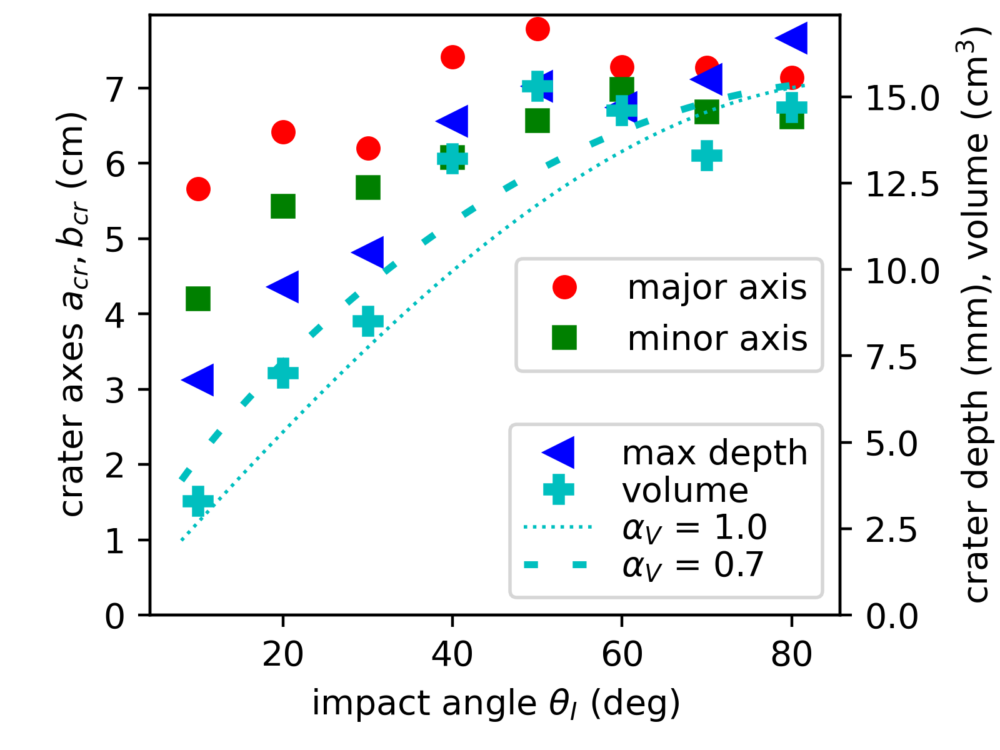

In [674]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200, facecolor='white')
plt.subplots_adjust(bottom=0.18,top=0.98,right=0.84,left=0.15)
ax.plot(theta_I,a_cr/10,'ro', label='major axis')
ax.plot(theta_I,b_cr/10,'gs', label='minor axis')
ax.set_xlabel(r'impact angle $\theta_I$ (deg)')
ax.set_ylabel(r'crater axes $a_{cr}, b_{cr}$ (cm)')
ax.set_ylim(bottom=0)
ax2 = ax.twinx()

ax2.set_ylabel(r'crater depth (mm), volume (cm$^3$)')
ax2.plot(theta_I,max_depth,'b<',ms=8,label='max depth')
ax2.plot(theta_I,vol,'cP',ms=8,label='volume')
#ax2.set_ylim([0,26])

ax.legend(loc='center right')
ax2.set_ylim(bottom=0)

tlin = np.linspace(8,82,100)
tlin_rad = tlin*np.pi/180.
alpha_V = 1.0; vol_mod = 15.5*(np.sin(tlin_rad))**alpha_V
ax2.plot(tlin,vol_mod,'c:',label=r'$\alpha_V$ = 1.0',lw=1)
alpha_V = 0.7; vol_mod = 15.5*(np.sin(tlin_rad))**alpha_V
ax2.plot(tlin,vol_mod,'c',label=r'$\alpha_V$ = 0.7',lw=2,dashes=[2,5])
ax2.legend(loc='lower right',labelspacing=0.1)
plt.savefig('majorminor.png',dpi=200)

# This figure shows that all dimensions of the crater increase with impact angle

Note crater efficiency is the ratio of $\rho_s V/m_p$ where $V$ is crater volume.
Here crater volume is volume inside $z=0$ contour. 
The increase of crater volume is equivalent to an increase in crater efficiency that has been
discussed via ISALE simulations by Elbeshausen_2009.
Note that Michikami_2017 also saw crater shape vary with impact angle in experiments of brittle targets.
Our work should be complimentary to these studies as we are stuyding a granular system. 

<IPython.core.display.Javascript object>


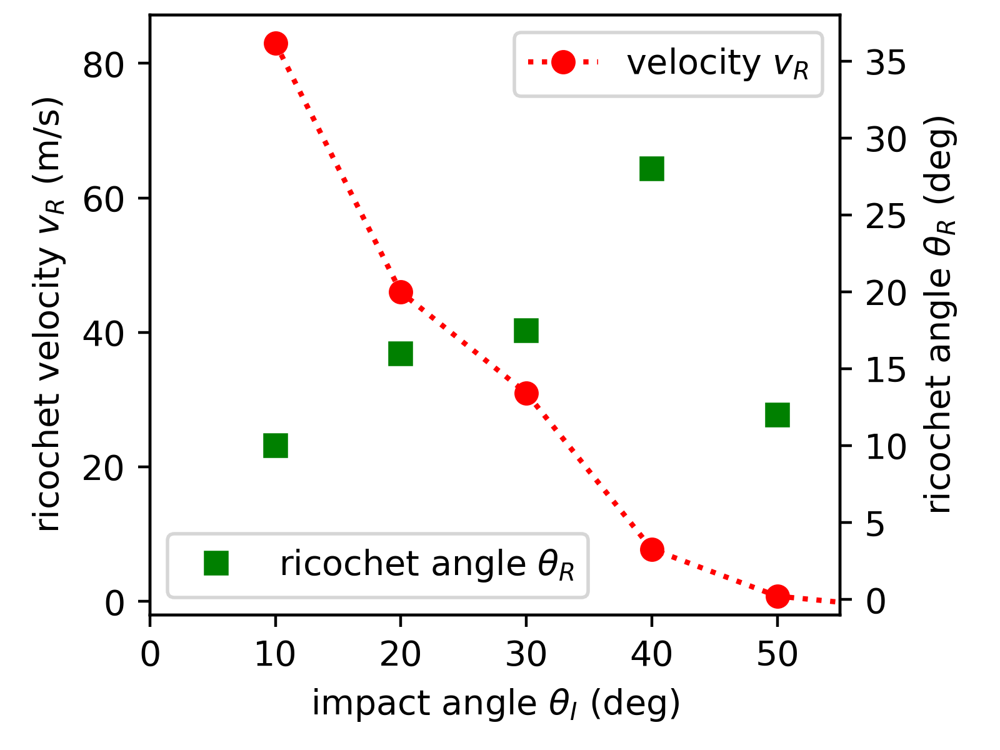

In [556]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200, facecolor='white')
plt.subplots_adjust(bottom=0.18,top=0.98,right=0.84,left=0.15)
ax.plot(theta_I,V_R,'ro:', label=r'velocity $v_R$')
#ax.plot(theta_I,V_R,'r:')
#ax.plot(theta_I,theta_R,'gs', label='ricochet angle')
ax.set_xlim([0,55])
ax2 = ax.twinx()
ax2.plot(theta_I,theta_R,'gs', label=r'ricochet angle $\theta_R$')
ax.set_xlabel(r'impact angle $\theta_I$ (deg)')
ax.set_ylabel(r'ricochet velocity $v_R$ (m/s)')
ax2.set_ylabel(r'ricochet angle $\theta_R$ (deg)')
#ax.set_xlim([18,52])
ax2.set_ylim([-1,38])
ax.legend()
ax2.legend(loc='lower left')
tlin = np.linspace(8.0,82,100)
tlin_rad = tlin*np.pi/180.
aaa = 3
vmod = 103*np.exp(-aaa*tlin_rad)
vmod2 = 103*(1-np.sin(tlin_rad)**0.5)
vmod3 = 103*(1- 1.3*tlin_rad)
ax.set_ylim(bottom=-2)
#ax.plot(tlin,vmod,color='orange',dashes=[2,6],lw=1)
#ax.plot(tlin,vmod2,color='orange',dashes=[2,6],lw=2)
#ax.plot(tlin,vmod3,color='orange',dashes=[2,6],lw=3)
plt.savefig('ricochet.png',dpi=200)

<IPython.core.display.Javascript object>


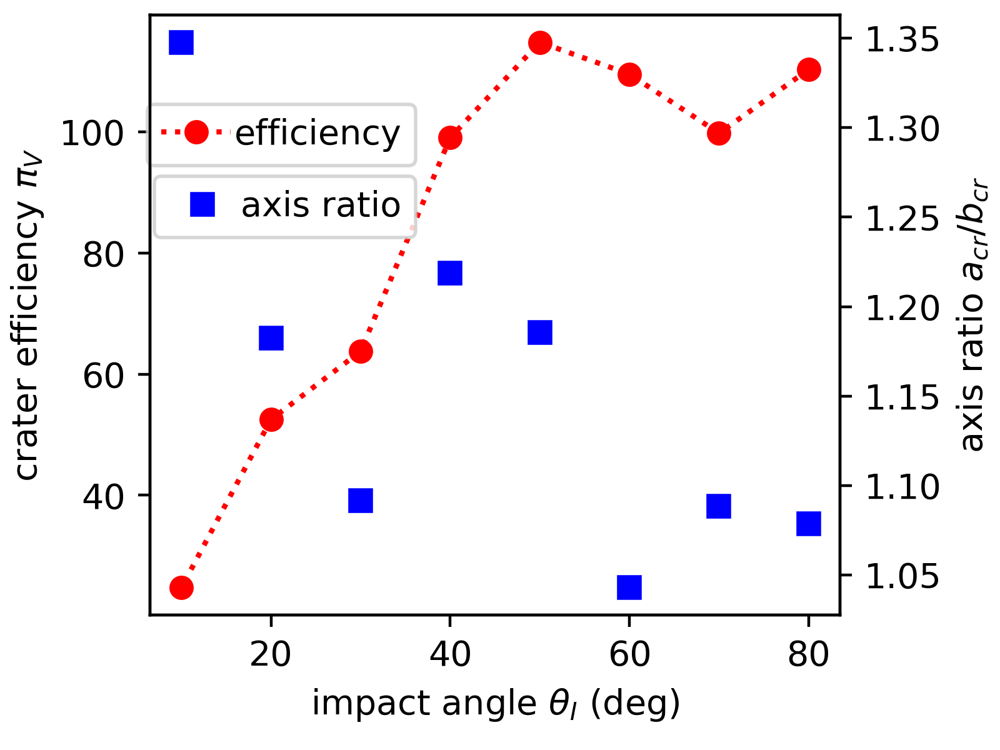

In [664]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200, facecolor='white')
plt.subplots_adjust(bottom=0.18,top=0.98,right=0.84,left=0.15)
ax2 = ax.twinx()
ax.plot(theta_I,crater_efficiency,'ro:', label='efficiency')
#ax.plot(theta_I,crater_efficiency,'r:')
ax2.plot(theta_I,a_cr/b_cr,'bs', label='axis ratio')
ax.legend(loc='lower right',handletextpad=0.1,bbox_to_anchor=(0.21, 0.72, 0.2, 0.2))
ax2.legend(loc='lower right',handletextpad=0.1,bbox_to_anchor=(0.21, 0.60, 0.2, 0.2))
ax.set_xlabel(r'impact angle $\theta_I$ (deg)')
ax.set_ylabel(r'crater efficiency $\pi_V$')
ax2.set_ylabel(r'axis ratio $a_{cr}/b_{cr}$')
plt.savefig('eff.png',dpi=200)

In [200]:
def readnpz(filename):
    npzfile = np.load(filename)
    xmm = npzfile['xmm']
    ymm =npzfile['ymm']
    zmm = npzfile['zmm_filt']
    slope = npzfile['slope_deg']
    still_im = npzfile['still_im_short']
    return xmm,ymm,zmm,slope,still_im

<IPython.core.display.Javascript object>


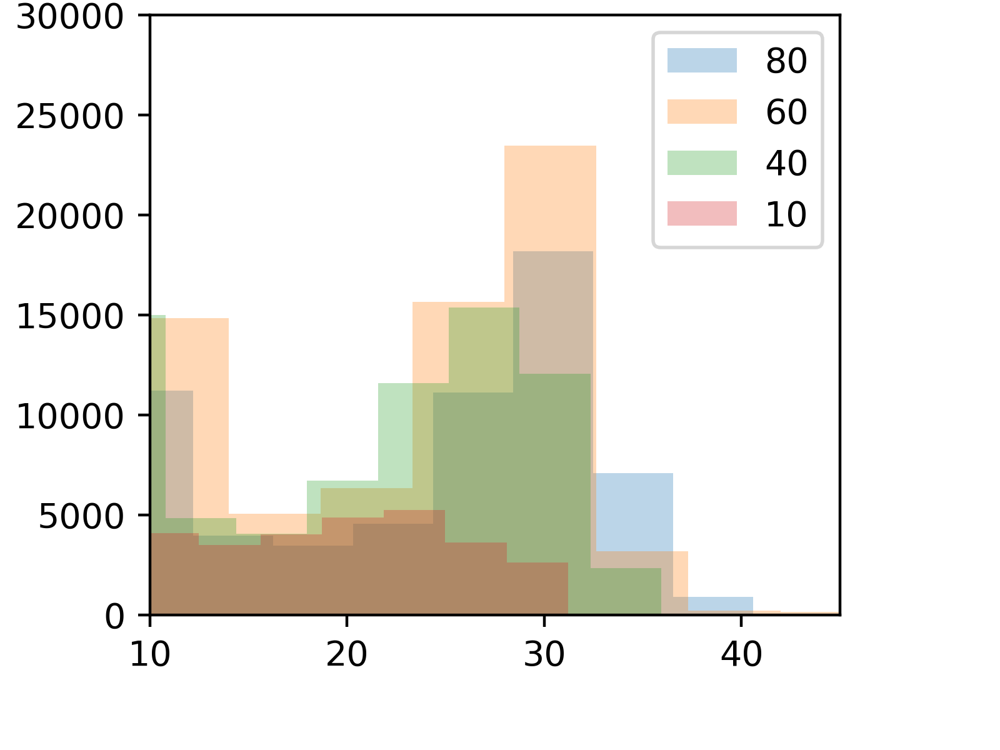

In [125]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200, facecolor='white')
plt.subplots_adjust(bottom=0.18,top=0.98,right=0.84,left=0.15)
ax.hist(np.ravel(slope_80),alpha=0.3,label='80')
ax.hist(np.ravel(slope_60),alpha=0.3,label='60')

ax.hist(np.ravel(slope_40),alpha=0.3,label='40')
ax.hist(np.ravel(slope_10),alpha=0.3,label='10')

ax.set_ylim([0,30000])
ax.set_xlim([10,45])
ax.legend()
# general trend that higher impact angles have steeper slopes

<IPython.core.display.Javascript object>


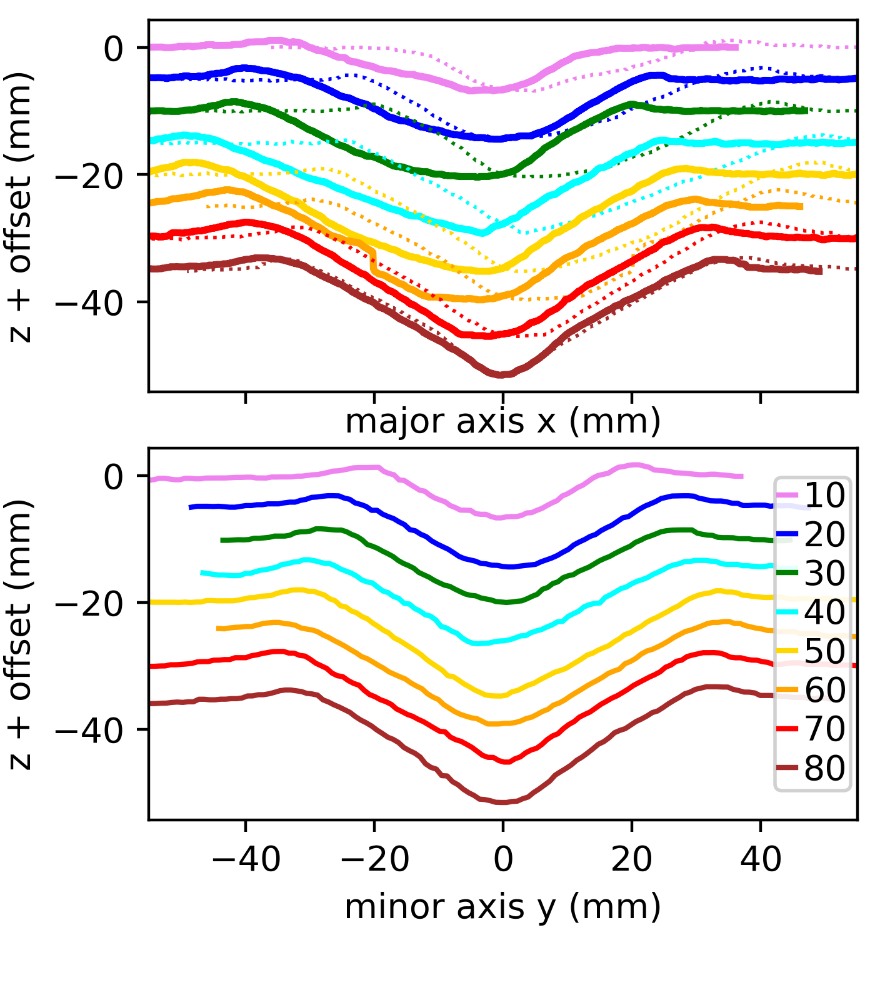

A10_profile.npz 0
A20_profile.npz 1
A30_profile.npz 2
A40_profile.npz 3
A50_profile.npz 4
A60_profile.npz 5
A70_profile.npz 6
A80_profile.npz 7


In [551]:
fig,axarr = plt.subplots(2,1,figsize=(3.5,4),dpi=200, facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.18,top=0.98,right=0.98,left=0.17,wspace=0,hspace=0.15)
axarr[0].set_xlim([-55,55])
dz_major= -5
dz_minor= -5
colorlist = ['violet','blue','green','cyan','gold','orange','red','brown']
for i in range(10,81,10):
    dx1=0
    fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
    j = int(i/10)-1
    print(fname,j)
    xmm,ymm,zmm,slope,still_im = readnpz(fname)
    ii = np.argmin(np.abs(ymm))
    deg_str = '{:2d}'.format(i)
    
    if (i==40):
        dx1=3
    axarr[0].plot(xmm+dx1,zmm[ii,:] + j*dz_major,'-',label=deg_str,color=colorlist[j],lw=2)
    axarr[0].plot(-(xmm+dx1),zmm[ii,:] + j*dz_major,':',label=deg_str,color=colorlist[j],lw=1)
    kk = np.argmin(np.abs(xmm))
    axarr[1].plot(ymm,zmm[:,kk] + j*dz_minor,'-',label=deg_str,color=colorlist[j])

axarr[0].set_ylabel('z + offset (mm)')
axarr[0].set_xlabel('major axis x (mm)')
axarr[1].set_ylabel('z + offset (mm)')
axarr[1].set_xlabel('minor axis y (mm)')
axarr[1].legend(loc='right',borderpad=0.1,handlelength=0.5,handletextpad=0.2,columnspacing=1,labelspacing=0.15\
               ,framealpha=0.9,borderaxespad=0.2)

plt.savefig('profiles.png',dpi=200)

<IPython.core.display.Javascript object>


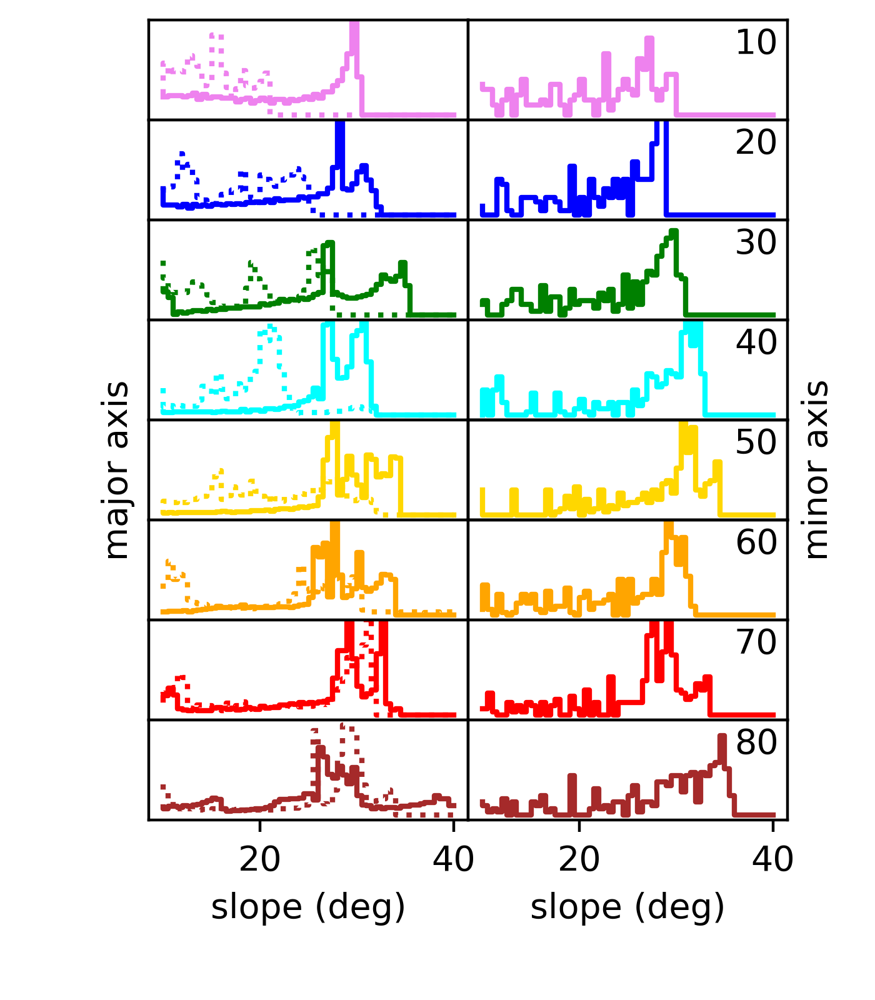

A10_profile.npz 0
A20_profile.npz 1
A30_profile.npz 2
A40_profile.npz 3
A50_profile.npz 4
A60_profile.npz 5
A70_profile.npz 6
A80_profile.npz 7


In [430]:
fig,axarr = plt.subplots(8,2,figsize=(3.5,4),dpi=200, facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.18,top=0.98,right=0.90,left=0.17,wspace=0,hspace=0.0)
colorlist = ['violet','blue','green','cyan','gold','orange','red','brown']
bins = np.arange(10,41,0.5)
axarr[0,0].set_ylim([-0.01,0.2])
for i in range(10,81,10):
    dx1=0
    fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
    j = int(i/10)-1
    print(fname,j)
    xmm,ymm,zmm,slope,still_im = readnpz(fname)
    ii = np.argmin(np.abs(ymm))  # could be flipped
    kk = np.argmin(np.abs(xmm))
    deg_str = '{:2d}'.format((j+1)*10)

    hist, bin_edges  = np.histogram(slope[ii-2:ii+3,kk:],bins=bins,density=True)
    axarr[j,0].step(bin_edges[:-1],hist ,'-',label=deg_str,color=colorlist[j],lw=1.5)
    hist, bin_edges  = np.histogram(slope[ii-2:ii+3,0:kk],bins=bins,density=True)
    axarr[j,0].step(bin_edges[:-1],hist ,':',label=deg_str,color=colorlist[j],lw=1.5)
    
    hist, bin_edges  = np.histogram(slope[:,kk-2:kk+3],bins=bins,density=True)
    axarr[j,1].step(bin_edges[:-1],hist ,'-',label=deg_str,color=colorlist[j],lw=1.5)
    hist, bin_edges  = np.histogram(slope[0:ii,kk-2:kk+3],bins=bins,density=True)

    axarr[j,0].set_yticks([])
    axarr[j,1].set_yticks([])
    axarr[j,1].text(36,0.13,deg_str,fontsize=10)
        
#axarr[7,0].set_ylabel('hist')
axarr[7,0].set_xlabel('slope (deg)')
axarr[7,1].set_xlabel('slope (deg)')
axarr[4,0].set_ylabel('major axis')
ax2 = axarr[4,1].twinx()
ax2.set_yticks([])
ax2.set_ylabel('minor axis')

plt.savefig('A_slopehist.png',dpi=200)

<IPython.core.display.Javascript object>


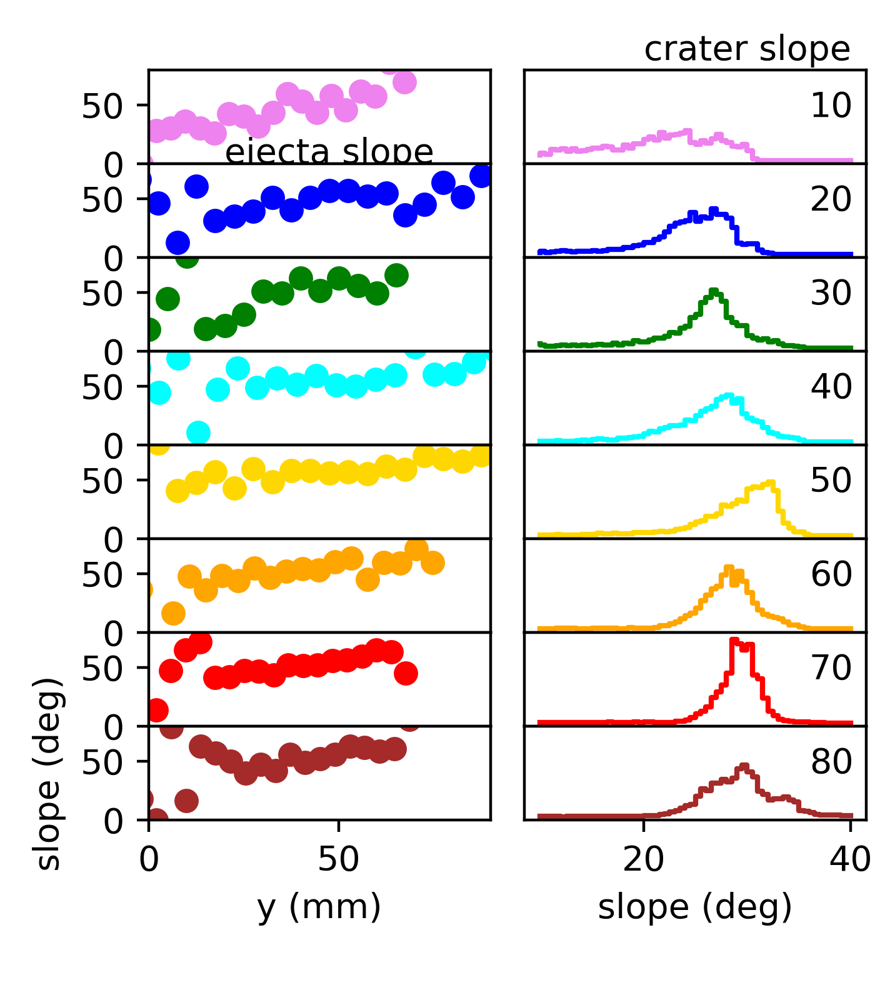

A10_profile.npz A10_quiver.npz 0
A20_profile.npz A20_quiver.npz 1
A30_profile.npz A30_quiver.npz 2
A40_profile.npz A40_quiver.npz 3
A50_profile.npz A50_quiver.npz 4
A60_profile.npz A60_quiver.npz 5
A70_profile.npz A70_quiver.npz 6
A80_profile.npz A80_quiver.npz 7


Text(0.5, 0, 'slope (deg)')

In [489]:
#Histograms of slopes on left
fig,axarr = plt.subplots(8,2,figsize=(3.5,4),dpi=200, facecolor='white',sharex=False,sharey=False)
plt.subplots_adjust(bottom=0.18,top=0.93,right=0.99,left=0.17,wspace=0.1,hspace=0.0)

colorlist = ['violet','blue','green','cyan','gold','orange','red','brown']
bins = np.arange(10,41,0.5)
#bins2 = np.arange(-90,90,5)

axarr[0,1].text(20,0.3,'crater slope')
axarr[0,0].text(20,0.3,'ejecta slope')

s_med = np.zeros(8)

for i in range(10,81,10):

    fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
    j = int(i/10)-1
    fnameq = 'A' + '{:2d}'.format(i) + '_quiver.npz'
    print(fname,fnameq,j)
    deg_str = '{:2d}'.format((j+1)*10)
    
    xarr,yarr,uarr,varr,image,ang_img_corr,extent_hsv = readnpz_quiver(fnameq)
    hx = np.linspace(extent_hsv[0],extent_hsv[1], ang_img_corr.shape[1])
    hy = np.linspace(extent_hsv[2],extent_hsv[3], ang_img_corr.shape[0])
    #print(ang_img_corr.shape,hx.shape,hy.shape)
    hxvec,hyvec = np.meshgrid(hx, np.flip(hy))  # symmetrical but flip is needed in y 
    
    xmm,ymm,zmm,slope,still_im = readnpz(fname)
    xvec,yvec = np.meshgrid(xmm,ymm) # no flip needed , is ok, checked 
    rvec = np.sqrt(xvec**2 + yvec**2)
    jj = np.logical_and(rvec <35, zmm <0)  # inside crater 
    kk = np.argmin(np.abs(hx+35))  # not flipped
    
    hist, bin_edges  = np.histogram(slope[jj],bins=bins,density=True)
    axarr[j,1].step(bin_edges[:-1],hist ,'-',color=colorlist[j],lw=1.5)
    axarr[j,1].set_ylim([-0.01,0.27])
    axarr[j,1].set_yticks([])
    axarr[j,1].text(36,0.13,deg_str,fontsize=10)
    if (j < 7):
        axarr[j,1].set_xticks([])
        axarr[j,0].set_xticks([])
        
    s_med[j] = np.median(slope[jj])
    
    #hist, bin_edges  = np.histogram(ang_img_corr[:,kk],bins=bins2,density=True)
    #axarr[j,1].step(bin_edges[:-1],hist ,'-',label=deg_str,color=colorlist[j],lw=1.5)
    axarr[j,0].plot(-hy,np.abs(ang_img_corr[:,kk]),'o',color=colorlist[j])  # flipped!
    axarr[j,0].set_xlim([0,90])
    axarr[j,0].set_ylim([0,80])
    
    
        
axarr[7,0].set_xlabel('y (mm)')
axarr[7,0].set_ylabel('slope (deg)')
#axarr[1].set_ylabel('z + offset (mm)')
axarr[7,1].set_xlabel('slope (deg)')
#axarr[7,1].legend(loc='right',borderpad=0.1,handlelength=0.5,handletextpad=0.2,columnspacing=1,labelspacing=0.15\
#,framealpha=0.9,borderaxespad=0.2)

#plt.savefig('profiles.png',dpi=200)

A10_profile.npz A10_quiver.npz 0
A20_profile.npz A20_quiver.npz 1
A30_profile.npz A30_quiver.npz 2
A40_profile.npz A40_quiver.npz 3
A50_profile.npz A50_quiver.npz 4
A60_profile.npz A60_quiver.npz 5
A70_profile.npz A70_quiver.npz 6
A80_profile.npz A80_quiver.npz 7


<IPython.core.display.Javascript object>


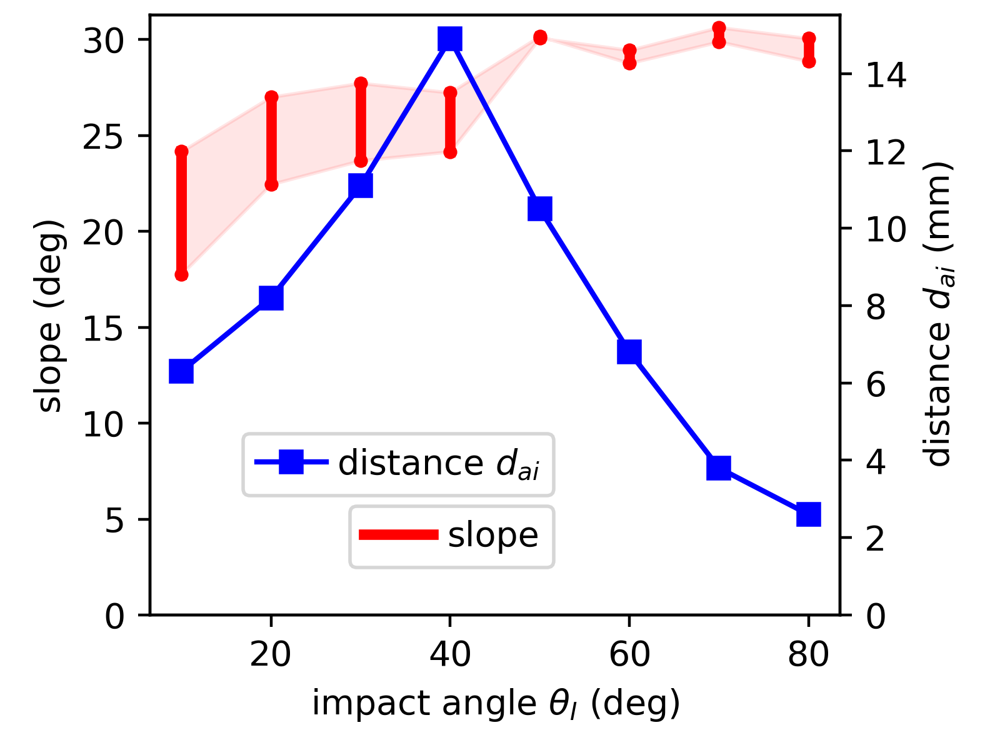

In [681]:
s_med = np.zeros(8)
s_med_up = np.zeros(8)
s_med_down = np.zeros(8)
theta_It = np.zeros(8)
for i in range(10,81,10):
    fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
    j = int(i/10)-1
    fnameq = 'A' + '{:2d}'.format(i) + '_quiver.npz'
    print(fname,fnameq,j)
    #deg_str = '{:2d}'.format((j+1)*10)
    
    xarr,yarr,uarr,varr,image,ang_img_corr,extent_hsv = readnpz_quiver(fnameq)
    hx = np.linspace(extent_hsv[0],extent_hsv[1], ang_img_corr.shape[1])
    hy = np.linspace(extent_hsv[2],extent_hsv[3], ang_img_corr.shape[0])
    #print(ang_img_corr.shape,hx.shape,hy.shape)
    hxvec,hyvec = np.meshgrid(hx, np.flip(hy))  # symmetrical but flip is needed in y 
    
    xmm,ymm,zmm,slope,still_im = readnpz(fname)
    xvec,yvec = np.meshgrid(xmm,ymm) # no flip needed , is ok, checked 
    rvec = np.sqrt(xvec**2 + yvec**2)
    phivec = np.arctan2(yvec,xvec)
    if (i==10):
        jj = np.logical_and(rvec <25, zmm <0)  # seems to fix problems in smallest crater 
    else:
        jj = np.logical_and(rvec <35, zmm <0)  # inside crater 
    jj = np.logical_and(jj, rvec >5)  # inside crater 
    s_med[j] = np.median(slope[jj])
    
    jj2 = np.logical_and(jj, np.abs(yvec) <10)  # near major axis
    jjup   = np.logical_and(jj2, xvec>0)  # uprange
    jjdown = np.logical_and(jj2, xvec<0) # downrange

    s_med_up[j] = np.median(slope[jjup])
    s_med_down[j] = np.median(slope[jjdown])
    theta_It[j] = i
    

#s_med_up[0] = 22; s_med_down[0] = 15
    
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200, facecolor='white')
plt.subplots_adjust(bottom=0.18,top=0.98,right=0.84,left=0.15)
ax2 = ax.twinx()
#ax.plot(theta_It,s_med,'ro', label='median slope')
ax.plot(theta_It,s_med_up,'ro', label ='',ms=3)
ax.plot(theta_It,s_med_down,'ro', label ='',ms=3)
ax.fill_between(theta_It,s_med_up, s_med_down, color='red',alpha=0.1)
ax.plot([theta_It[0],theta_It[0]],[s_med_up[0],s_med_down[0]],'r-', label ='slope',lw=3)
for i in range(8):

    ax.plot([theta_It[i],theta_It[i]],[s_med_up[i],s_med_down[i]],'r-', label ='',lw=3)
    
                                       
#ax.plot(theta_It,s_med_down,'c<', label='slope down')
ax2.plot(theta_I,np.abs(dmx),'bs-', label=r'distance $d_{ai}$')
ax.legend(loc='lower right',handletextpad=0.4,bbox_to_anchor=(0.41, 0.05, 0.2, 0.2))
ax2.legend(loc='lower right',handletextpad=0.3,bbox_to_anchor=(0.41, 0.17, 0.2, 0.2))
ax.set_xlabel(r'impact angle $\theta_I$ (deg)')
ax.set_ylabel('slope (deg)')
ax2.set_ylabel(r'distance $d_{ai}$ (mm)')
#plt.savefig('eff.png',dpi=200)
ax.set_ylim(bottom=0)
ax2.set_ylim(bottom=0)


plt.savefig('med_slope.png',dpi=200)

In [682]:
for i in range(0,8):
    print('{:.0f}'.format(s_med_up[i]))
print(" ")
for i in range(0,8):
    print('{:.0f}'.format(s_med_down[i]))

24
27
28
27
30
29
30
29
 
18
22
24
24
30
29
31
30


In [ ]:
for i in range(0,8):
    print('{:.0f}'.format(s_med[i]))

A10_profile.npz A10_quiver.npz 0
(36, 50) (50,) (36,)


<IPython.core.display.Javascript object>


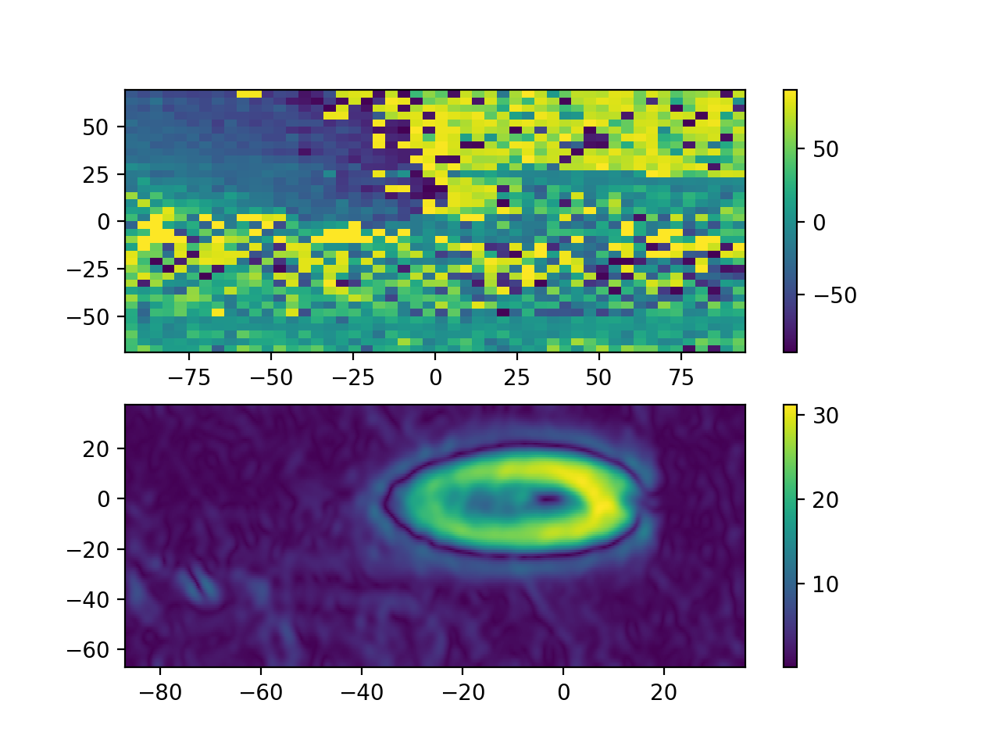

In [449]:
# check axes and stuff
i=10
fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
j = int(i/10)-1
fnameq = 'A' + '{:2d}'.format(i) + '_quiver.npz'
print(fname,fnameq,j)
deg_str = '{:2d}'.format((j+1)*10)
xarr,yarr,uarr,varr,image,ang_img_corr,extent_hsv = readnpz_quiver(fnameq)
hx = np.linspace(extent_hsv[0],extent_hsv[1], ang_img_corr.shape[1])
hy = np.linspace(extent_hsv[2],extent_hsv[3], ang_img_corr.shape[0])
hxvec,hyvec = np.meshgrid(hx, np.flip(hy))  # symmetrical but flip is needed 
print(ang_img_corr.shape,hx.shape,hy.shape)
xmm,ymm,zmm,slope,still_im = readnpz(fname)
xvec,yvec = np.meshgrid(xmm,(ymm))  # no flip needed, looks okay
rvec = np.sqrt(xvec**2 + yvec**2)
fig,(ax1,ax2) = plt.subplots(2,1)
#ax1.imshow(zmm)
im=ax1.pcolormesh(hxvec,hyvec,ang_img_corr)
plt.colorbar(im,ax=ax1)
im=ax2.pcolormesh(xvec,yvec,slope)
plt.colorbar(im,ax=ax2)
jj = np.logical_and(rvec <35, zmm <0)  # inside crater 
kk = np.argmin(abs(hx+35))
#plt.plot(ang_img_corr[:,kk],'ro')

In [231]:
# make a nice figure of crater profile!
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
def mkcmap(xmm,ymm,zmm,ax,froot):
    extent = [np.min(xmm),np.max(xmm),np.min(ymm),np.max(ymm)]  # for x,y axes of plots
    #fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=200,facecolor='white')
    #plt.subplots_adjust(bottom=0.15,top=0.98,left=0.17,right=0.96)
    #ax.set_aspect(1.0)
    vmin,vmax=-16,3.5  # display range mm, these can be adjusted!
    mcolors=['darkviolet','blue','white','red']
    white_node = np.abs(vmin)/(vmax-vmin)
    cyan_node  = np.abs(vmin/2)/(vmax-vmin)
    nodes = [0.0, cyan_node,white_node,1.0]
    cmap2 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, mcolors)))
    im=ax.imshow(zmm,extent=extent,vmin=vmin,vmax=vmax,cmap=cmap2)
    #levs = [-14,-12,-10,-8,-6,-4,-2,0,1,2]
    levs = np.append(np.arange(-14,0,2),np.arange(0,4,1))
    cols = []
    for i in range(len(levs)):
        if (levs[i] <0):
            cols = np.append(cols,'white')
        else:
            cols = np.append(cols,'brown')

    ccw=ax.contour(zmm, extent=extent,levels=levs,colors=cols,linewidths=0.2,origin='upper')
    
    #ax.text(52,46,'z (mm)')
    #if (cbarx==1):
    #    cbar=plt.colorbar(im,shrink=0.7,anchor=(0.0, 0.4))
    #    cbar.add_lines(ccw)  
        
    #ax.set_xlim([x_winl,x_winr])
    #ax.set_ylim([y_winl,y_winr])
    #ax.set_ylabel('y (mm)')
    #ax.set_xlabel('x (mm)')
    ax.plot([0],[0],'y+',ms=10,lw=1,alpha=0.5)
    ax.text(-73,32,froot[1:3]+r'$^\circ$',color='black',fontsize=12)
    #print(froot)
    return im,ccw
    
#plt.savefig(froot+'contour.png',dpi=200)
# looks good!

<IPython.core.display.Javascript object>


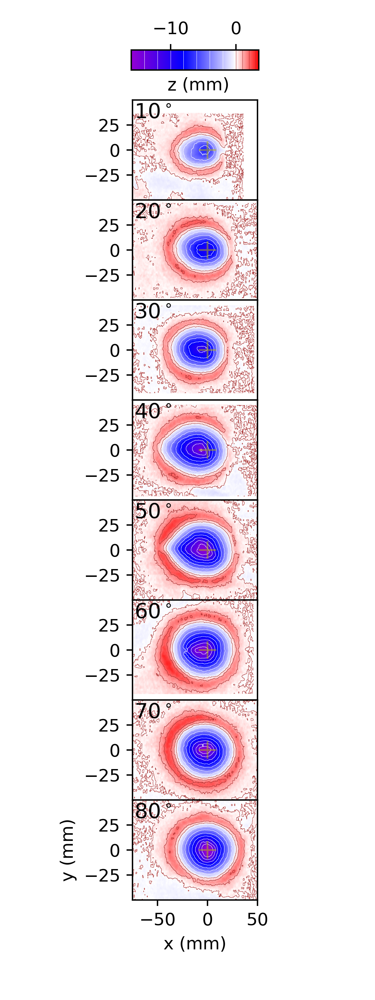

In [278]:
fig,axarr = plt.subplots(8,1,figsize=(3,8),dpi=200,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.10,top=0.90,left=0.05,right=0.99,hspace=0,wspace=0)
axarr[0].set_aspect(1.0)
x_winl, x_winr = -75,50
y_winl, y_winr = -50,50
axarr[0].set_xlim([x_winl,x_winr])
axarr[0].set_ylim([y_winl,y_winr])
axarr[0].set_yticks([-25,0,25])
axarr[7].set_ylabel('y (mm)')
axarr[7].set_xlabel('x (mm)')
for i in range(10,81,10):
    fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
    j = int(i/10)-1
    #print(fname,j)
    xmm,ymm,zmm,slope,still_im = readnpz(fname)
    im,ccw=mkcmap(xmm,ymm,zmm,axarr[j],fname)
#cbar=plt.colorbar(im,ax = (axarr[0],axarr[1],axarr[2],axarr[3],axarr[4],axarr[5],axarr[6],axarr[7]),\
#                  shrink=0.4,anchor=(0.5, -0.0),pad=0.01,location='top',aspect=15) 

#cbar.set_label('z (mm)')
#cbar.add_lines(ccw)  

rect = 0.35, 0.93, 0.34,0.02
cax = fig.add_axes(rect)
cbar=plt.colorbar(im,cax=cax,ax = (axarr[0],axarr[1],axarr[2],axarr[3],axarr[4],axarr[5],axarr[6],axarr[7]),\
                  shrink=0.4,pad=0.01,aspect=15,panchor=False,orientation='horizontal',ticklocation='top' ) 
#,panchor=(1.0, 0.0) anchor=(0.5, -0.0), location='top',
#cbar.set_label('slope (deg)',loc='top')
axarr[0].text(-40,60,'z (mm)',fontsize=10)
cbar.add_lines(ccw)  
plt.savefig('A_contour.png',dpi=200)

In [238]:
# make a nice figure of crater slopes
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
def mksmap(xmm,ymm,slope,ax,froot):
    extent = [np.min(xmm),np.max(xmm),np.min(ymm),np.max(ymm)]  # for x,y axes of plots
    
    vmin,vmax=0,40  # display range degrees, these can be adjusted!
    ax.set_facecolor('navy')
    im=ax.imshow(slope,extent=extent,vmin=vmin,vmax=vmax,cmap='jet')
    levs = np.arange(vmin,vmax,2.5)
    cols = 'brown'
    ccw=ax.contour(slope, extent=extent,levels=levs,colors=cols,linewidths=0.2,origin='upper')
    #ax.text(52,38,'slope \n(deg)')
    #cbar.add_lines(ccw)  
    #ax.set_xlim([x_winl,x_winr])
    #ax.set_ylim([y_winl,y_winr])
    #ax.set_ylabel('y (mm)')
    #ax.set_xlabel('x (mm)')
    ax.plot([0],[0],'y+',ms=10,lw=1,alpha=0.5)
    ax.text(-73,32,froot[1:3]+r'$^\circ$',color='white',fontsize=12)
    #plt.savefig(froot+'slope.png',dpi=200)
    return im,ccw
    


<IPython.core.display.Javascript object>


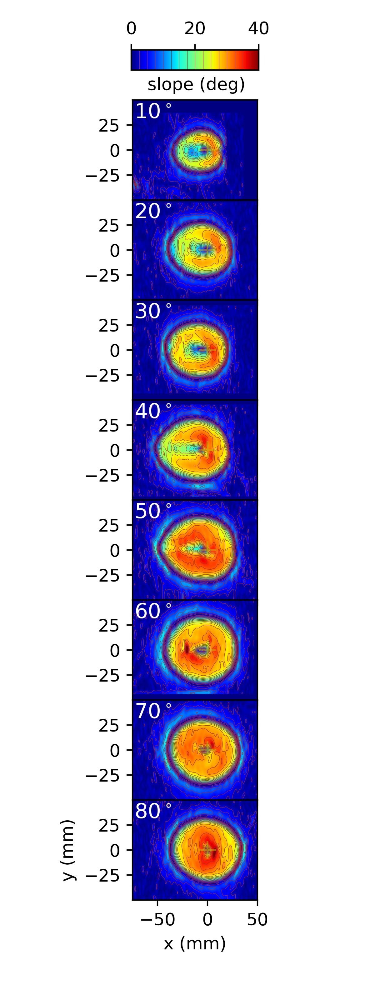

In [274]:
fig,axarr = plt.subplots(8,1,figsize=(3,8),dpi=200,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.10,top=0.90,left=0.05,right=0.99,hspace=0,wspace=0)
axarr[0].set_aspect(1.0)
x_winl, x_winr = -75,50
y_winl, y_winr = -50,50
axarr[0].set_xlim([x_winl,x_winr])
axarr[0].set_ylim([y_winl,y_winr])
axarr[0].set_yticks([-25,0,25])
axarr[7].set_ylabel('y (mm)')
axarr[7].set_xlabel('x (mm)')
for i in range(10,81,10):
    fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
    j = int(i/10)-1
    #print(fname,j)
    xmm,ymm,zmm,slope,still_im = readnpz(fname)
    im,ccw=mksmap(xmm,ymm,slope,axarr[j],fname)
    
    
rect = 0.35, 0.93, 0.34,0.02
cax = fig.add_axes(rect)
cbar=plt.colorbar(im,cax=cax,ax = (axarr[0],axarr[1],axarr[2],axarr[3],axarr[4],axarr[5],axarr[6],axarr[7]),\
                  shrink=0.4,pad=0.01,aspect=15,panchor=False,orientation='horizontal',ticklocation='top' ) 
#,panchor=(1.0, 0.0) anchor=(0.5, -0.0), location='top',
#cbar.set_label('slope (deg)',loc='top')
axarr[0].text(-60,60,'slope (deg)',fontsize=10)
cbar.add_lines(ccw)  
plt.savefig('A_slope.png',dpi=200)

In [305]:
# make a nice figure of crater photos
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
def mkpmap(extent_still,still_im,ax,froot):
    #extent = [np.min(xmm),np.max(xmm),np.min(ymm),np.max(ymm)]  # for x,y axes of plots
    #fig,ax = plt.subplots(1,1,figsize=(3.5,3),dpi=200,facecolor='white')
    #plt.subplots_adjust(bottom=0.23,top=0.90,left=0.17,right=0.96)
    #ax.set_aspect(1)
    ax.imshow(still_im,extent=extent_still)
    #ax.set_xlabel('x (mm)')
    #ax.set_ylabel('y (mm)')
    ax.plot([0],[0],'k+',ms=5)
    #ax.set_xlim([x_winl,x_winr])
    ax.text(-73,31,froot[1:3]+r'$^\circ$',color='black',fontsize=14)
    #plt.savefig(froot+'still.png',dpi=200)
    
    #return im,ccw
    


<IPython.core.display.Javascript object>


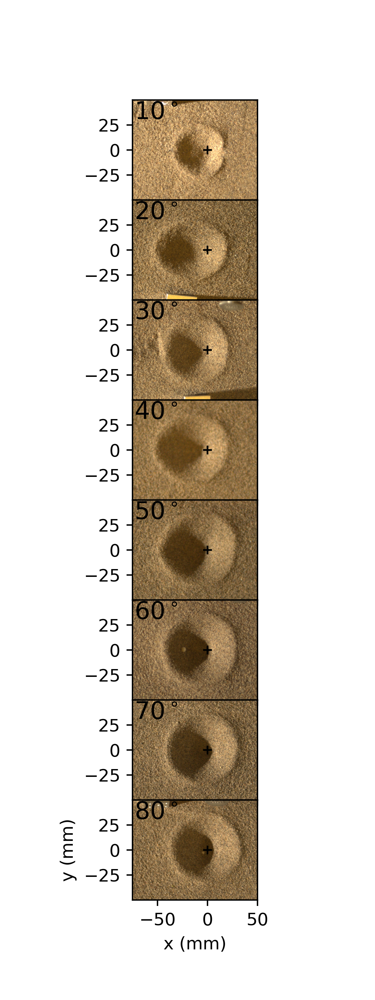

In [306]:
fig,axarr = plt.subplots(8,1,figsize=(3,8),dpi=200,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.10,top=0.90,left=0.05,right=0.99,hspace=0,wspace=0)
axarr[0].set_aspect(1.0)
x_winl, x_winr = -75,50
y_winl, y_winr = -50,50
extent_still = [x_winl,x_winr,y_winl,y_winr]
axarr[0].set_xlim([x_winl,x_winr])
axarr[0].set_ylim([y_winl,y_winr])
axarr[0].set_yticks([-25,0,25])
axarr[7].set_ylabel('y (mm)')
axarr[7].set_xlabel('x (mm)')
for i in range(10,81,10):
    fname = 'A' + '{:2d}'.format(i) + '_profile.npz'
    j = int(i/10)-1
    #print(fname,j)
    xmm,ymm,zmm,slope,still_im = readnpz(fname)
    mkpmap(extent_still,still_im,axarr[j],fname)
#cbar=plt.colorbar(im,ax = (axarr[0],axarr[1],axarr[2],axarr[3],axarr[4],axarr[5],axarr[6],axarr[7]),\
#                  shrink=0.4,anchor=(0.5, -0.0),pad=0.01,location='top',aspect=15) 
#,panchor=(1.0, 0.0)orientation='horizontal'
#cbar.set_label('slope (deg)')
#cbar.add_lines(ccw)  
plt.savefig('A_still.png',dpi=200)

In [290]:
def readnpz_quiver(filename):
    npzfile = np.load(filename)
    xarr = npzfile['xarr']
    yarr =npzfile['yarr']
    uarr =npzfile['uarr']
    varr =npzfile['varr']
    image =npzfile['image']
    ang_img_corr = npzfile['ang_img_corr']
    extent_hsv=npzfile['extent_hsv']
    return xarr,yarr,uarr,varr,image,ang_img_corr,extent_hsv
#ofile = froot + 'quiver'
#np.savez(ofile, xarr=xarr, yarr=yarr,uarr = uarr, varr= varr, image = image, ang_img_corr = ang_img_corr, \
#        extent_hsv=extent_hsv)


<IPython.core.display.Javascript object>


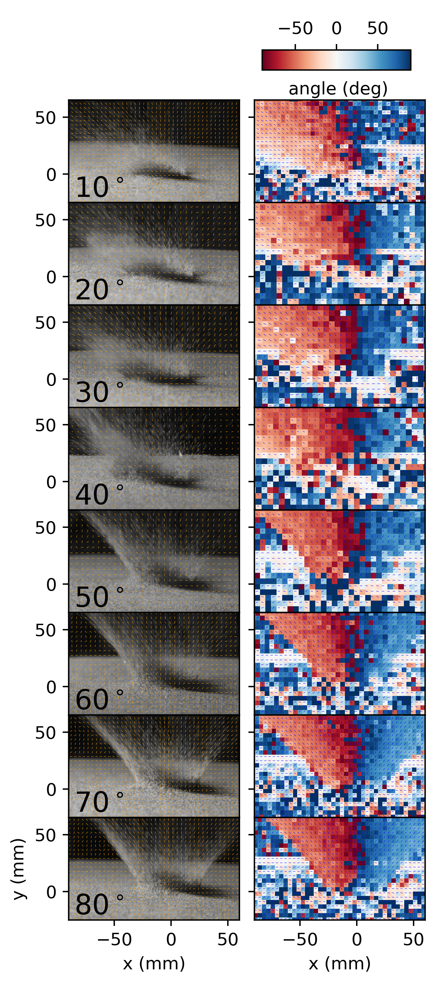

In [307]:
fig, axarr = plt.subplots(8, 2, figsize=(3.5, 8),sharex=True,sharey=True,facecolor='white',dpi=200)  
plt.subplots_adjust(bottom=0.08,top=0.90,left=0.14,right=0.99,hspace=0,wspace=0)
axarr[7,0].set_xlabel('x (mm)'); axarr[7,1].set_xlabel('x (mm)')
axarr[7,0].set_ylabel('y (mm)')
axarr[7,0].set_ylim([-25,65])
axarr[7,0].set_xlim([-90,60])

for i in range(10,81,10):
    fname = 'A' + '{:2d}'.format(i) + '_quiver.npz'
    j = int(i/10)-1
    #print(fname,j)
    xarr,yarr,uarr,varr,image,ang_img_corr,extent_hsv = readnpz_quiver(fname)
    
    axarr[j,0].imshow(image, cmap=plt.cm.gray,extent=extent_hsv)
    axarr[j,0].quiver(xarr,yarr,uarr,varr,color='orange',pivot='mid',width=0.002,\
              headwidth=0,headlength=0,headaxislength=0)

    im=axarr[j,1].imshow(ang_img_corr,extent=extent_hsv,cmap='RdBu',vmin=-90, vmax=90)
    axarr[j,1].quiver(xarr,yarr,uarr,varr,color='blue',pivot='mid',width=0.002,\
              headwidth=0,headlength=0,headaxislength=0)
    
    
    axarr[j,0].text(-85,-20,fname[1:3]+r'$^\circ$',color='black',fontsize=16)
    #plt.savefig(froot+'quiver.png',dpi=200)
    
rect = 0.60, 0.93, 0.34,0.02
cax = fig.add_axes(rect)
cbar=plt.colorbar(im,cax=cax,ax = (axarr[0,1],axarr[1,1],axarr[2,1],axarr[3,1],axarr[4,1],axarr[5,1],axarr[6,1],axarr[7,1]),\
                  shrink=0.4,pad=0.01,aspect=15,panchor=False,orientation='horizontal',ticklocation='top' ) 

axarr[0,1].text(-60,70,'angle (deg)',fontsize=10)
plt.savefig('A_quiver.png',dpi=200)

<IPython.core.display.Javascript object>


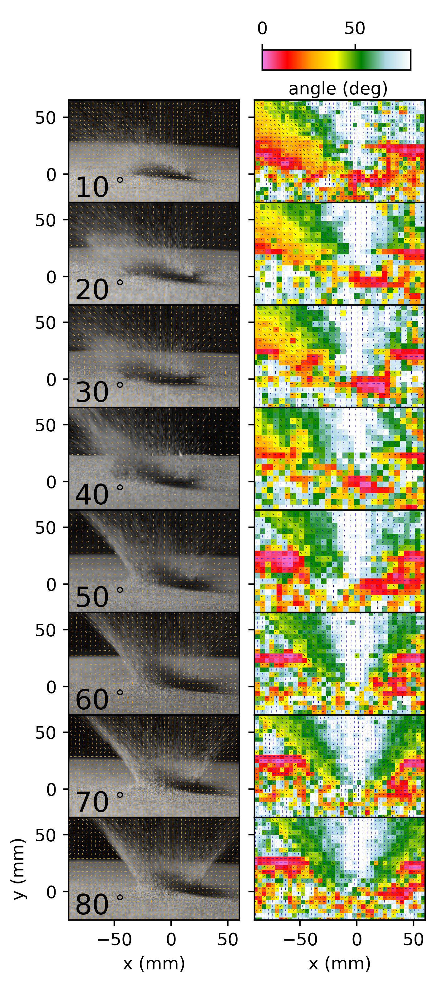

In [486]:
fig, axarr = plt.subplots(8, 2, figsize=(3.5, 8),sharex=True,sharey=True,facecolor='white',dpi=200)  
plt.subplots_adjust(bottom=0.08,top=0.90,left=0.14,right=0.99,hspace=0,wspace=0)
axarr[7,0].set_xlabel('x (mm)'); axarr[7,1].set_xlabel('x (mm)')
axarr[7,0].set_ylabel('y (mm)')
axarr[7,0].set_ylim([-25,65])
axarr[7,0].set_xlim([-90,60])



mcolors=['violet','red','orange','yellow','green','lightblue','white']

nodes =  np.linspace(0,1.,7)
cmap2 = LinearSegmentedColormap.from_list("mycmap", list(zip(nodes, mcolors)))


for i in range(10,81,10):
    fname = 'A' + '{:2d}'.format(i) + '_quiver.npz'
    j = int(i/10)-1
    #print(fname,j)
    xarr,yarr,uarr,varr,image,ang_img_corr,extent_hsv = readnpz_quiver(fname)
    ang_img_corr_smo = ndimage.gaussian_filter(np.abs(ang_img_corr),[0.5,0.5])
    
    axarr[j,0].imshow(image, cmap=plt.cm.gray,extent=extent_hsv)
    axarr[j,0].quiver(xarr,yarr,uarr,varr,color='orange',pivot='mid',width=0.002,\
              headwidth=0,headlength=0,headaxislength=0)

    im=axarr[j,1].imshow(ang_img_corr_smo,extent=extent_hsv,cmap=cmap2,vmin=0, vmax=80)
    axarr[j,1].quiver(xarr,yarr,uarr,varr,color='blue',pivot='mid',width=0.002,\
              headwidth=0,headlength=0,headaxislength=0)
    
    
    axarr[j,0].text(-85,-20,fname[1:3]+r'$^\circ$',color='black',fontsize=16)
    #plt.savefig(froot+'quiver.png',dpi=200)
    
rect = 0.60, 0.93, 0.34,0.02
cax = fig.add_axes(rect)
cbar=plt.colorbar(im,cax=cax,ax = (axarr[0,1],axarr[1,1],axarr[2,1],axarr[3,1],axarr[4,1],axarr[5,1],axarr[6,1],axarr[7,1]),\
                  shrink=0.4,pad=0.01,aspect=15,panchor=False,orientation='horizontal',ticklocation='top' ) 

axarr[0,1].text(-60,70,'angle (deg)',fontsize=10)
plt.savefig('A_quiver2.png',dpi=200)




In [623]:
def umag(R,z,Z):
    r = np.sqrt(R**2 + z**2)
    z_r = z/r
    u_r = r**(-Z) 
    u_t = r**(-Z)*(Z-2.)*np.sqrt(1-z_r**2)/(1 + np.abs(z_r))
    u_mag = np.sqrt(u_r**2 + u_t**2)
    ang_ej = np.arctan(Z-2.)
    return r,u_r, u_t, u_mag,ang_ej

# compute some derivatives
def dumagdZ(R,z,Z,dZ):
    r,u_r, u_t, u_mag1,ang_ej1 = umag(R,z,Z)
    r,u_r, u_t, u_mag2,ang_ej2 = umag(R,z,Z+dZ)
    dudZ = (u_mag2-u_mag1)/dZ   # is actually 1/u du/dZ
    dudZ /= u_mag1  # should be unitless
    dadZ = (ang_ej2-ang_ej1)/dZ  # is probably not a vector
    return dudZ,dadZ




<IPython.core.display.Javascript object>


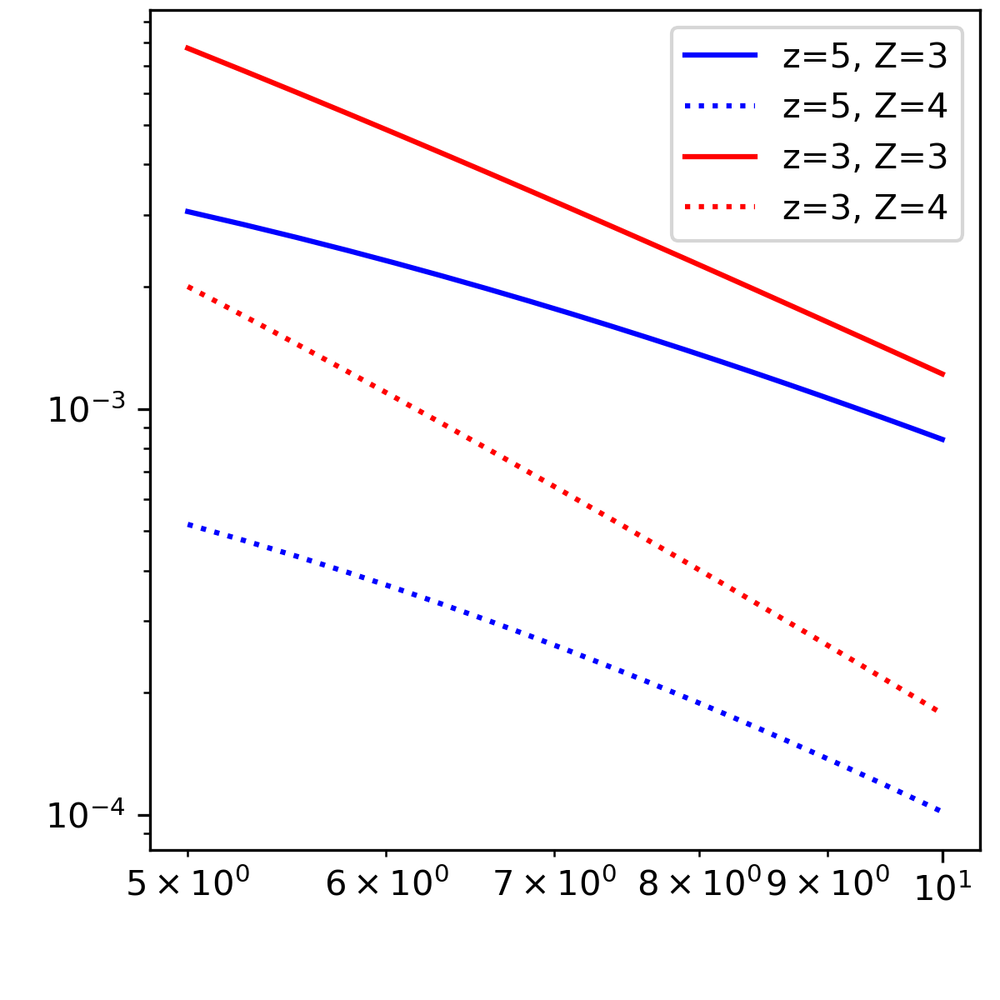

In [624]:
fig,ax = plt.subplots(1,1,figsize=(4,4),dpi=150,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.15,top=0.99,left=0.15,right=0.98,hspace=0,wspace=0)  
ax.set_xscale("log")
ax.set_yscale("log")

Rlin = np.linspace(5,10,20)
zlin = np.zeros(20) + 5.0
Z  = 3.0
r,u_r, u_t, u_mag,ang_ej = umag(Rlin,zlin,Z)
ax.plot(Rlin,u_mag,'b-',label='z=5, Z=3')
Z  = 4.0
r,u_r, u_t, u_mag,ang_ej = umag(Rlin,zlin,Z)
ax.plot(Rlin,u_mag,'b:',label='z=5, Z=4')

Z  = 3.0
zlin = np.zeros(20) + 2.0
r,u_r, u_t, u_mag,ang_ej = umag(Rlin,zlin,Z)
ax.plot(Rlin,u_mag,'r-',label='z=3, Z=3')

Z  = 4.0
r,u_r, u_t, u_mag,ang_ej = umag(Rlin,zlin,Z)
ax.plot(Rlin,u_mag,'r:',label='z=3, Z=4')


ax.legend()


<IPython.core.display.Javascript object>


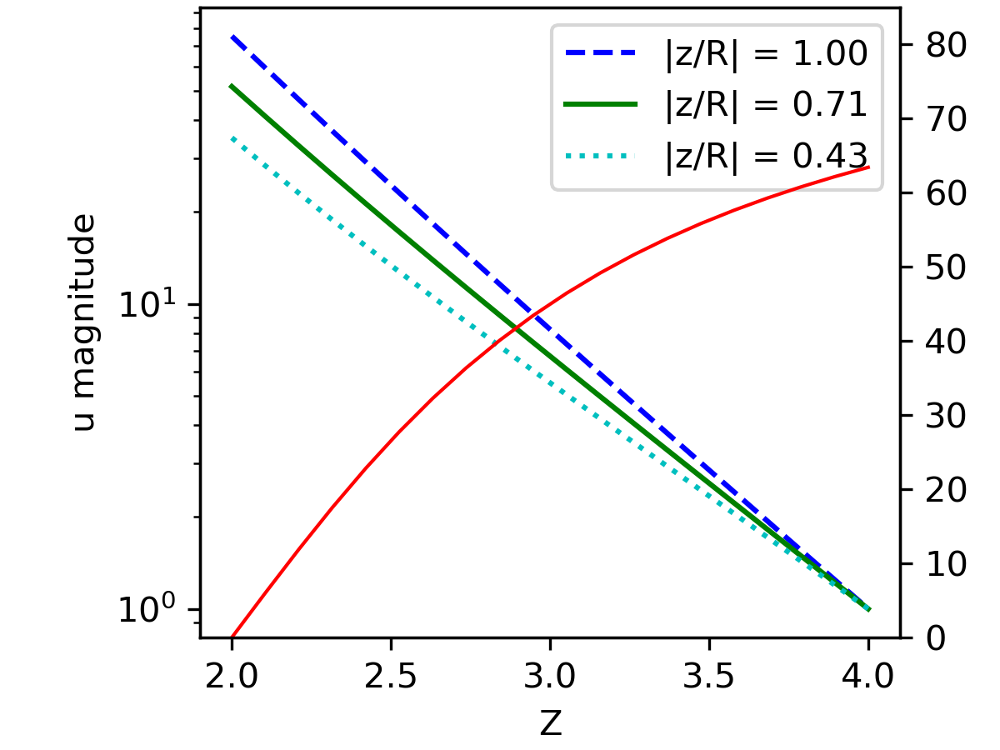

In [608]:

fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=150,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.15,top=0.99,left=0.20,right=0.90,hspace=0,wspace=0)  
#ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel('Z')
ax.set_ylabel('u magnitude')
Zlin = np.linspace(2.0,4,20)


R = 7.; z = 7. # 
r,u_r, u_t, u_mag,ang_ej  = umag(R,z,Zlin)
lstring = '|z/R| = {:.2f}'.format(z/R)
ax.plot(Zlin,u_mag/u_mag[-1],'b--',label=lstring)

R = 7.; z = 5. # 
r,u_r, u_t, u_mag,ang_ej  = umag(R,z,Zlin)
lstring = '|z/R| = {:.2f}'.format(z/R)
ax.plot(Zlin,u_mag/u_mag[-1],'g-',label=lstring)

R = 7.; z = 3. # 
r,u_r, u_t, u_mag,ang_ej  = umag(R,z,Zlin)
lstring = '|z/R| = {:.2f}'.format(z/R)
ax.plot(Zlin,u_mag/u_mag[-1],'c:',label=lstring)

ax2 = ax.twinx()
ax2.set_ylim([0,85])

ax2.plot(Zlin,ang_ej*180.0/np.pi,'r-',lw=1,label=r'$\theta_ej$')


# looks approximately linear

ax.legend()

<IPython.core.display.Javascript object>


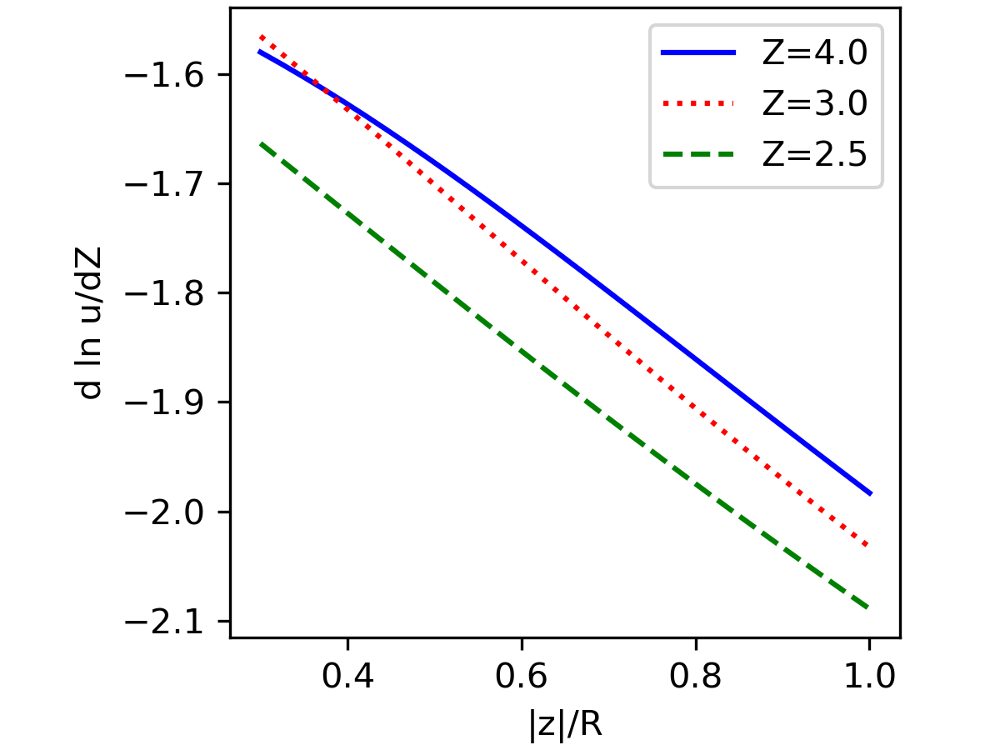

dadZ=0.20 radians,  dadZ=11.23 (deg)
dadZ=0.49 radians,  dadZ=27.94 (deg)
dadZ=0.78 radians,  dadZ=44.91 (deg)


In [654]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=150,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.15,top=0.99,left=0.23,right=0.90,hspace=0,wspace=0)  
#ax.set_xscale("log")
#ax.set_yscale("log")
ax.set_xlabel(r'|z|/R')
ax.set_ylabel(r'd ln u/dZ')
zr_lin = np.linspace(0.3,1.0,30)


R = 7.; z = zr_lin*R # 
dZ = 0.05

Z=4.0
dudZ,dadZ=dumagdZ(R,z,Z,dZ)
ax.plot(zr_lin,dudZ,'b-',label='Z=4.0')
print('dadZ={:.2f} radians,  dadZ={:.2f} (deg)'.format(dadZ,dadZ*180/np.pi))

Z=3.0
dudZ,dadZ=dumagdZ(R,z,Z,dZ)
ax.plot(zr_lin,dudZ,'r:',label='Z=3.0')
print('dadZ={:.2f} radians,  dadZ={:.2f} (deg)'.format(dadZ,dadZ*180/np.pi))

Z=2.5
dudZ,dadZ=dumagdZ(R,z,Z,dZ)
ax.plot(zr_lin,dudZ,'g--',label='Z=2.5')
print('dadZ={:.2f} radians,  dadZ={:.2f} (deg)'.format(dadZ,dadZ*180/np.pi))


#ax2 = ax.twinx()
#ax2.set_ylim([0,85])
#ax2.plot(Zlin,ang_ej*180.0/np.pi,'r-',lw=1,label=r'$\theta_ej$')


# looks approximately linear

ax.legend()
plt.savefig('dumax.png',dpi=200)

<IPython.core.display.Javascript object>


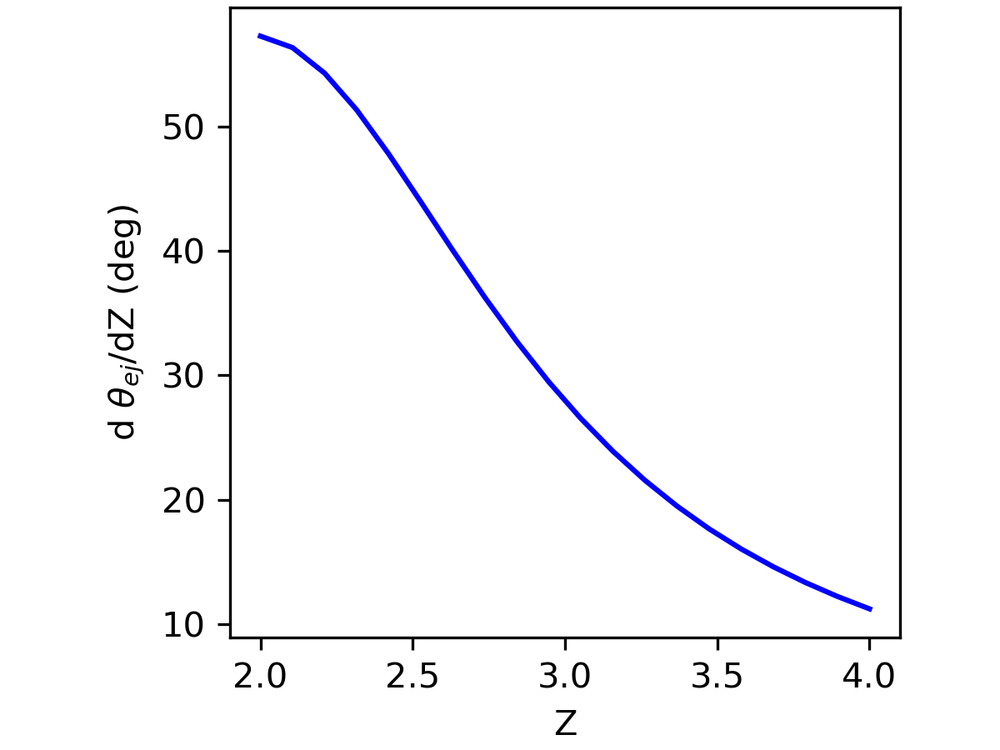

In [655]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=150,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.15,top=0.99,left=0.23,right=0.90,hspace=0,wspace=0)  
#ax.set_xscale("log")
#ax.set_yscale("log")
ax.set_xlabel(r'Z')
ax.set_ylabel(r'd $\theta_{ej}$/dZ (deg)')
zr_lin = np.linspace(0.3,1.0,30)


R = 7.; z = R # 
dZ = 0.05

Zlin=np.linspace(2,4,20)
dudZ,dadZ=dumagdZ(R,z,Zlin,dZ)
ax.plot(Zlin,dadZ*180/np.pi,'b-',label='Z=4.0')

plt.savefig('dtheta_ej.png',dpi=200)

<IPython.core.display.Javascript object>


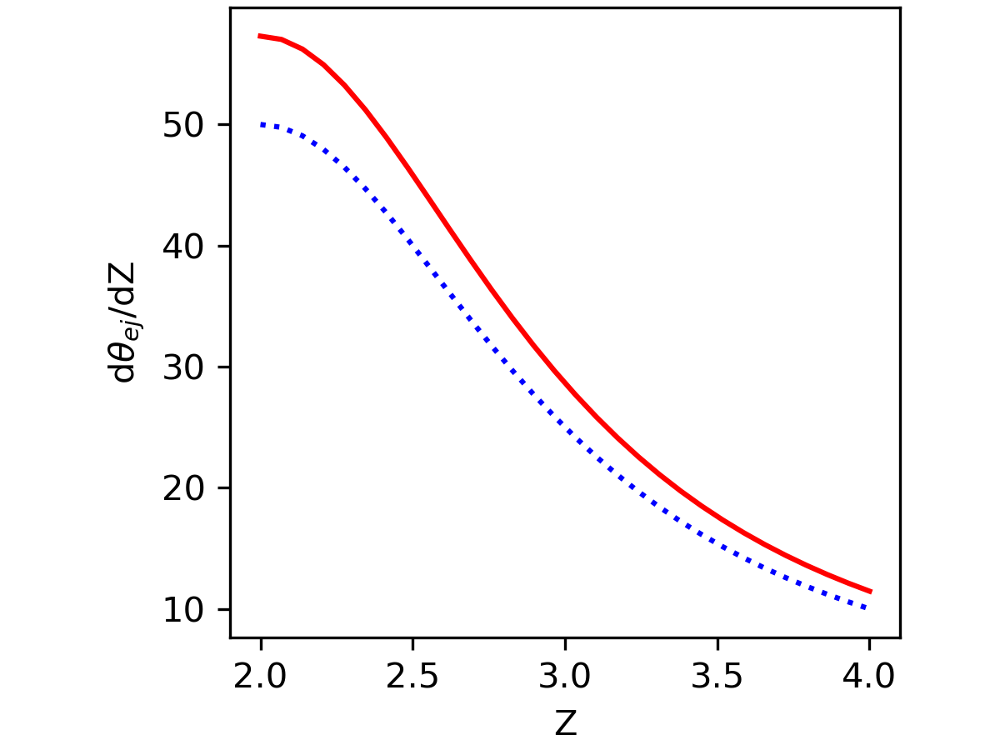

Text(0, 0.5, 'd$\\theta_{ej}$/dZ')

In [661]:
fig,ax = plt.subplots(1,1,figsize=(4,3),dpi=150,facecolor='white',sharex=True,sharey=True)
plt.subplots_adjust(bottom=0.15,top=0.99,left=0.23,right=0.90,hspace=0,wspace=0)  

Zlin = np.linspace(2,4,30)
theta_ej = 1.0/(1 + (Zlin-2)**2) # in rad
junk = (Z-2) /(1 + (Zlin-2)**2) #
ax.plot(Zlin,theta_ej*180/np.pi,'r-')
ax.plot(Zlin,junk*100,'b:')
ax.set_xlabel('Z')
ax.set_ylabel(r'd$\theta_{ej}$/dZ')